In [1]:
%reset -f
import cv2
import os
import glob 
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import sys
import datetime
import matplotlib
sys.path.insert(1, r'C:\Users\hjoon\Documents\PycharmProjects\CameraCalibration')
matplotlib.use('TkAgg')
from ipynb_modules.analyzer import *

def now_str():
    now = datetime.datetime.now()
    output = '*[{}/{} {}:{}:{}]*'.format(now.month, now.day, now.hour, now.minute, now.second)
    return output


from modules.calibrator import *
from configs import *

mpl.style.use('seaborn')

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
cams = Calibrator.cams

%matplotlib notebook
# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

print('init')

init


## Load bundle adjustment data

In [2]:
# load bundle adjustment data
print('start')
# bundle_path = r'C:/Users/joont/Documents/Visual Studio 2017/Projects/CeresTest_v3/CeresTest/output/191124_ba_experiments/1/bundleadjustment_output.txt'
# bundle_path = r'C:/Users/joont/Documents/Visual Studio 2017/Projects/CeresTest_v3/CeresTest/output/191126_synthetic2/bundleadjustment_output.txt'
# bundle_path = r'C:\Users\joont\Documents\PycharmProjects\CameraCalibration\data\BundleAdjustment\output\bundle_adjustment_zfree\1\bundleadjustment_output.txt'
bundle_path = r'D:\CalibrationData\CameraCalibration\2020_01_01_KateyCapture\BundleAdjustment\output\bundle_adjustment_6dof\bundleadjustment_output.txt'
cam_params, frames, g_chb_corners, final_cost = Analyzer.load_bundle_adj_output(bundle_path, 16)

for cam_idx, p in cam_params.items():
    k = [p['k1'], p['k2'], p['k3'], p['k4'], p['k5'], p['k6']]
    p = [p['p1'], p['p2'], p['p3'], p['p4'], p['p5'], p['p6']]
    print('cam[{}]\n  k={}\n  p={}'.format(cam_idx, k, p))
print('done')

start
 - 6-DoF checkerboard orientations exist
cam[0]
  k=[0.1099, 0.109572, 0.0521825, 0.174898, 0.0167182, 0.141946]
  p=[-0.000102586, 0.00091288, 0.0, 0.0, 0.0, 0.0]
cam[1]
  k=[0.099169, 0.100046, 0.0765434, 0.160688, 0.0245067, 0.14944]
  p=[0.000113559, 8.47418e-05, 0.0, 0.0, 0.0, 0.0]
cam[2]
  k=[0.0797521, 0.0979421, 0.015405, 0.144842, -4.86836e-05, 0.118907]
  p=[-0.000311344, -0.000136771, 0.0, 0.0, 0.0, 0.0]
cam[3]
  k=[0.0701346, 0.1055, -0.0110081, 0.14003, -0.0138747, 0.118454]
  p=[-0.000489735, 6.55771e-05, 0.0, 0.0, 0.0, 0.0]
cam[4]
  k=[-0.00621585, 0.108248, -0.127197, 0.0758064, -0.0945759, 0.13748]
  p=[0.000234633, 0.000102852, 0.0, 0.0, 0.0, 0.0]
cam[5]
  k=[0.0479929, 0.112093, -0.0713203, 0.125383, -0.0529848, 0.1262]
  p=[-0.000650895, -2.71329e-05, 0.0, 0.0, 0.0, 0.0]
cam[6]
  k=[-0.0166756, 0.110853, -0.136087, 0.0689613, -0.103879, 0.140707]
  p=[-0.00039606, 6.46489e-05, 0.0, 0.0, 0.0, 0.0]
cam[7]
  k=[0.0500642, 0.103203, -0.0379897, 0.12554, -0.0326818

## Reproject world points onto image points

In [3]:
configs = {
    'max_k': 6,
    'max_p': 2,
    'radial_model': 1,
    'loss_type':'none',
    'loss_huber_delta': 1.0
}


img_pts_pred = Analyzer.reproject_bundle_output(cam_params, frames, configs, g_chb_corners)

  0/604  100/604  200/604  300/604  400/604  500/604  600/604

## Load image points

In [4]:
measurement_path = r'D:\CalibrationData\CameraCalibration\2020_01_01_KateyCapture\BundleAdjustment\input\image_points.json'
img_pts_opencv = Analyzer.load_bundle_adj_input(measurement_path)
print('done: {} frames'.format(len(img_pts_opencv.keys())))

done: 604 frames


### Render image coverage

<IPython.core.display.Javascript object>


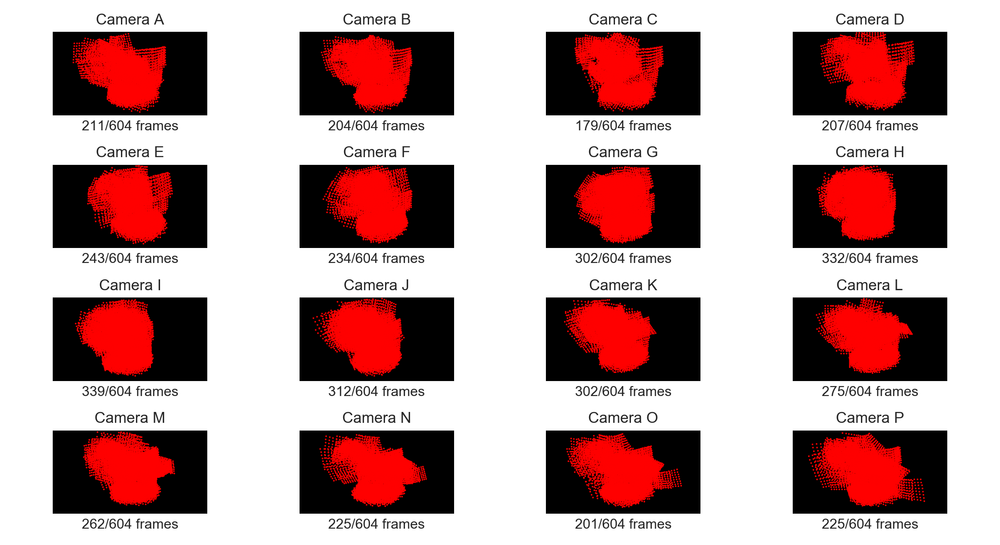

In [5]:
img_pts_by_cams = {}
for img_name, v in img_pts_opencv.items():
    for cam_idx, pts in v.items():
        if cam_idx in img_pts_by_cams:
            img_pts_by_cams[cam_idx].append(pts)
        else:
            img_pts_by_cams[cam_idx] = [pts]

fig, axes = plt.subplots(4, 4, figsize=(11, 6), tight_layout=True)
axes = axes.ravel()
blank = np.zeros((2160, 4000, 3)).astype('uint8')
sz = 1
total_num_frames = len(img_pts_opencv.keys())
for cam_idx in range(16):
    num_frames = len(img_pts_by_cams[cam_idx])
    pts = np.array(img_pts_by_cams[cam_idx]).reshape((-1,2))
    axes[cam_idx].imshow(blank)
    axes[cam_idx].scatter(pts[:, 0], pts[:, 1], s=sz, c='r')
    axes[cam_idx].grid(False)
    axes[cam_idx].set_xticks([]), axes[cam_idx].set_yticks([])
    axes[cam_idx].set_title('Camera {}'.format(cams[cam_idx]))
    axes[cam_idx].set_xlabel('{}/{} frames'.format(num_frames, total_num_frames))
plt.show()
    

        

## Compute reprojection errors

In [6]:
reproj_errs, err_data, sanity_err = Analyzer.compute_reprojection_errors(img_pts_pred, img_pts_opencv, configs)

mean = sum(reproj_errs)/len(reproj_errs)
max_err = max(reproj_errs)
var = np.var(reproj_errs)

num_frames = len(err_data)
print('{} frames'.format(num_frames))
print('- mean = {:<8.4f} [pixel/point]'.format(mean))
print('- var  = {:<8.4f}'.format(var))
print('- max  = {:<8.4f} [pixel/point]'.format(max_err))

# sanity check
# sanity_err = 0.5*np.sum(np.array(reproj_errs)**2)

reg = 1
if reg:
    for cam_idx, p in cam_params.items():
        # reg
        sanity_err += 0.5*(p['k1']**2 + p['k2']**2 + p['k3']**2 + p['k4']**2 + p['k5']**2 + p['k6']**2 + p['p1']**2 + p['p2']**2)
        
print()
print('Sanity check: mine({:.4f}) vs ceres({:.4f}) | error={:.2f}%'.format(sanity_err, final_cost, abs(final_cost-sanity_err)/final_cost * 100.0))
print('done')

604 frames
- mean = 0.1794   [pixel/point]
- var  = 0.0190  
- max  = 6.6103   [pixel/point]

Sanity check: mine(9125.9906) vs ceres(9266.4400) | error=1.52%
done


## Reprojection error histogram

|idx |max. errs ||   max    | num cams ||    1     |    2     |    3     |    4     |    5     |    6     |    7     |    8     |
| 1  |01550.pgm ||   2.03   |    3     ||   1.97   |          |          |          |          |          |          |          |
| 2  |01555.pgm ||   3.23   |    3     ||   2.76   |   3.23   |          |          |          |          |          |          |
| 3  |01560.pgm ||   2.06   |    2     ||          |   1.91   |   2.06   |          |          |          |          |          |
| 4  |01565.pgm ||   2.69   |    3     ||          |          |   2.69   |   2.12   |   2.21   |          |          |          |
| 5  |01570.pgm ||   2.30   |    4     ||          |          |          |   2.30   |   1.38   |   1.26   |   1.95   |          |
| 6  |01575.pgm ||   2.11   |    4     ||          |          |          |          |          |   1.78   |   1.07   |   1.45   |
| 7  |01585.pgm ||   2.18   |    5     ||          |          |          |          |     

c:\users\hjoon\appdata\local\continuum\anaconda3\envs\utah\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


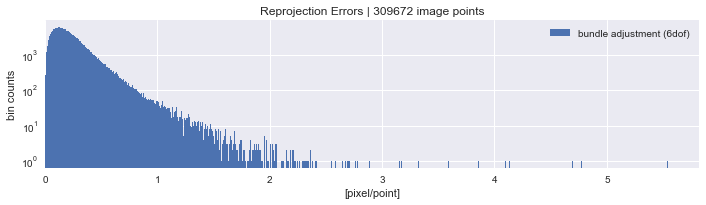

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
from matplotlib.gridspec import GridSpec

do_print = True
max_err_image_names = []
if do_print:
    print('|{:^4}|{:^10}||{:^10}|{:^10}||{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|'.format('idx', 'max. errs', 'max', 'num cams', 1, 2, 3, 4, 5, 6, 7, 8))
    idx = 1
    for img_name, v in err_data.items():
        errs = {}
        max_err = -1
        num_cams = 0
        for cam_idx in range(16):
            if cam_idx in v:
                errs[cam_idx] = '{:.2f}'.format(np.max(v[cam_idx]))
                max_err = max(np.max(v[cam_idx]), max_err)
                num_cams += 1
            else:
                errs[cam_idx] = ''
        if max_err > 2:
            print('|{:^4}|{:^10}||{:^10.2f}|{:^10.0f}||{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|{:^10}|'.format(idx, img_name+'.pgm', max_err, num_cams, errs[0], errs[1], errs[2], errs[3], errs[4], errs[5], errs[6], errs[7]))
            max_err_image_names.append(img_name)
            idx += 1
print(max_err_image_names)
mpl.style.use('seaborn')
# mpl.rcParams['axes.prop_cycle'] = cycler(color='rbgcmyk')
num_bins = 1000
plt.rcParams["figure.figsize"] = (12, 3) # (w, h)
fig = plt.figure(constrained_layout=True, tight_layout=True)
gs = GridSpec(1, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, :])

# linear
ax1.hist(reproj_errs, bins=num_bins)
ax1.set_yscale('log')
ax1.set_xlim(left=0)
ax1.set_xlabel('[pixel/point]')
ax1.set_ylabel('bin counts')
ax1.set_title('Reprojection Errors | {} image points'.format(len(reproj_errs)))
ax1.legend(['bundle adjustment (6dof)'])
plt.grid(True)
plt.show()

## Render image

02835


<IPython.core.display.Javascript object>


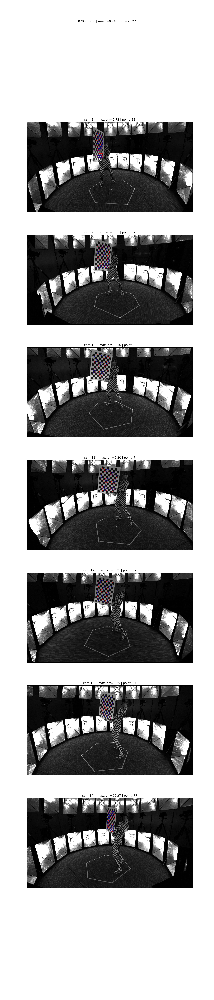

done


In [8]:
mpl.style.use('default')
import mpld3
mpld3.enable_notebook()
%matplotlib notebook
# img_names = ['00580', '00610', '00635', '00835', '00860', '00920', '00985', '02090', '02105', '02810', '04420', '04425', '04475', '04505', '04510', '04520', '04525', '04530', '04540', '04550', '04560']
img_names = ['02835']
for img_name in img_names:
    print(img_name)
    img_path = r'\\DATACHEWER\shareZ\2019_12_03_capture\Converted\\'
    scale = 1.0
    # Analyzer.render_projections(img_name, scale, img_pts_pred[img_name], img_pts_opencv[img_name], err_data[img_name], img_path, (min_u, min_v), (max_u, max_v))
    Analyzer.render_projections(img_name, scale, img_pts_pred[img_name], img_pts_opencv[img_name], err_data[img_name], img_path)
    
# configure plots
plt.rcParams["figure.figsize"] = (13, 20) # (w, h)
plt.show()
print('done')

## [SAVE] render image

In [109]:
mpl.style.use('default')
import mpld3
mpld3.enable_notebook()
%matplotlib inline
save_path = r'D:\CalibrationData\CameraCalibration\191205_16Cams\ExportedImages\Reprojections'
# img_names = ['00580', '00610', '00635', '00835', '00860', '00920', '00985', '02090', '02105', '02810', '04420', '04425', '04475', '04505', '04510', '04520', '04525', '04530', '04540', '04550', '04560']
img_names = ['02835', '03040', '03240', '03380', '03700', '03710', '03855', '03875', '03880', '03885', '03965', '04065', '04095', '04240', '04265', '04270']
save = 1
# img_names = ['00985']
for img_name in img_names:
    print(img_name)    
    img_path = r'\\DATACHEWER\shareZ\2019_12_03_capture\Converted\\'
    scale = 1.0
    Analyzer.render_projections(img_name, scale, img_pts_pred[img_name], img_pts_opencv[img_name], err_data[img_name], img_path)
    # configure plots
    plt.rcParams["figure.figsize"] = (13, 20) # (w, h)
    
    if save:
        plt.savefig(save_path + '\\bund_' + img_name + '.jpg', dpi=300)
        plt.close('all')
        
    if not save:    
        plt.show()
print('done')


02835
03040
03240
03380
03700
03710
03855
03875
03880
03885
03965
04065
04095
04240
04265
04270
done
